In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from random 
DT = 0.01
DAMP = 0.5


In [13]:
class Particle:
    """
    Fields:
        pos: position as np array
        pos_prev: previous position as np array
        acc: acceleration as np array
        m: mass as scalar float
        
    Methods:
        verlet()
            args: none
            does: updates position with regard to acceleration
            return: none
        apply_forces():
            args: net_force as np.array
            does: makes acc = force/m
            returns: none
    """
    n_particles = 0
    
    def __init__(self, pos = np.zeros(2), acc = np.zeros(2), m = 1, vel_i = np.zeros(2), lock = False):
        self.pos = np.array(pos)
        self.acc = np.array(acc)
        self.pos_prev = self.pos - np.array(vel_i) * DT - 0.5 * self.acc * DT * DT
        self.m = m
        self.lock = lock
        self.particle_id = self.n_particles
        self.n_particles += 1
    
    def verlet(self):
        if not self.lock:
            next_pos = self.pos * 2 - self.pos_prev + self.acc * DT * DT
            self.pos_prev, self.pos = self.pos, next_pos
    
    def apply_forces(self, net_force):
         if not self.lock:
            self.acc += net_force / self.m
    
    def get_direction_to(self, other):
        return np.sign(other.pos - self.pos)
        
    def __repr__(self):
        return "\n Particle " + str(self.particle_id) + ": \n\t Position: " + str(self.pos) \
                + "\n\t Past Position: " + str(self.pos_prev) \
                + "\n\t Acceleration: " + str(self.acc) \
                + "\n\t Mass: " + str(self.m) \
                + "\n\t Achored: " + str(self.lock)

In [14]:
class Spring:
    n_springs = 0
    
    def __init__(self, k, node1, node2, d=None):
        self.k = k
        self.node1 = node1
        self.node2 = node2
        if d == None:
            self.d = abs(self.node1.pos - self.node2.pos)
        else:
            self.d = d
        self.spring_id = self.n_springs
        self.n_springs += 1
        
    def get_force(self):
        """
            Hooke's Law: F = kx
        """
        delta_pos = abs(self.node1.pos - self.node2.pos)
        x =  delta_pos - self.d 
        force = self.k * x
        return force
    
    def apply_constraint(self):
        force = self.get_force()
        s1_2 = self.node1.get_direction_to(self.node2)
        s2_1 = self.node2.get_direction_to(self.node1)
        self.node1.apply_forces((s1_2*force)-0.3*(s1_2*force))
        self.node2.apply_forces((s2_1*force)-0.3*(s2_1*force))

    def __repr__(self):
        return "Spring " + str(self.spring_id) + ": \n\t Position1: " + str(self.node1.pos) \
                + "Position2: " + str(self.node2.pos) \
                + "\n\t Length: " + str(self.d) \
                + "\n\t k: " + str(self.k) 

In [15]:
class Mesh:
    def __init__(self, dt = 0.1):
        global DT 
        DT = dt
        self.particles = list()
        self.springs = list()
    
    def add_particle(self, particle):
        self.particles.append(particle)
        
    def add_spring(self, spring):
        self.springs.append(spring)
    
    def batch_add(self, particles, springs):
        self.particles += particles
        self.springs += springs
    
    def apply_constraints(self):
        for particle in self.particles:
            particle.verlet()
        for spring in self.springs:
            spring.apply_constraint()
        
    
    def display_mesh(self):
        x = []
        y = []
        for particle in self.particles:
            x.append(particle.pos[0])
            y.append(particle.pos[1])
            
        plt.plot(x, y, "o")
        
        lines = []
        for spring in self.springs:
            
            a = spring.node1.pos
            b = spring.node2.pos
            lines.append([a,b])
            
        lc = LineCollection(lines, color=["k","blue"], lw=0.5)
        
        plt.gca().add_collection(lc)
        plt.show()

    def run_static_loop(self, n, show=False):
        for _ in range(n):
            self.apply_constraints()
    
    

In [16]:
### TESTING ###

### 10x10, 320 spring ###
def mesh_construct(N):
    def c2i(x,y,n):
        return x * (n) + y
    def create_grid(N):
        nodes = [(i//N, i%N) for i in range(N*N)]
        # edges = np.zeros(( (N-1)*(N-1) + 2*N) *4).reshape(((N-1)*(N-1) + 2*N), 2, 2)
        edges = []
        for x in range(N):
            for y in range(N):
                if x < (N - 1) and y < (N - 1):
                    edges.append((c2i(x,y,N),c2i(x+1,y,N)))
                    edges.append((c2i(x,y,N),c2i(x,y+1,N)))
                    edges.append((c2i(x,y,N),c2i(x+1,y+1,N)))

                elif x < (N - 1) and y == (N - 1):
                    edges.append((c2i(x,y,N),c2i(x+1,y,N)))

                elif y < (N - 1) and x == (N - 1):
                    edges.append((c2i(x,y,N),c2i(x,y+1,N)))
        return edges, nodes
    
    edges, nodes = create_grid(N)
    
    particles = [Particle(p, (0, 0.5), 0.1) for p in nodes]
    springs = [Spring(1, particles[ns[0]], particles[ns[1]]) for ns in edges]
    particles[c2i(0, N-1, N)].lock = True
    particles[c2i(N-1, N-1, N)].lock = True
    print(particles[c2i(N-1, N-1, N)])
    mesh = Mesh()
    mesh.batch_add(particles, springs)
    mesh.display_mesh()
    
    for _ in range(150):
        mesh.run_static_loop(10)
        mesh.display_mesh()
    
### Two Particle, One spring, osilation WITH mesh ###
def mesh_two_body():
    mesh = Mesh()
    
    particle1 = Particle((10,0), (0,0), 100, (0,0))
    particle2 = Particle((-10,0), (0,0), 10, (0,0))
    spring = Spring(K, particle1, particle2, [15,0])
    
    particles = [particle1, particle2]
    springs = [spring]
    
    mesh.batch_add(particles, springs)
    mesh.display_mesh()
    
    for _ in range(15):
        mesh.run_static_loop(100)
        mesh.display_mesh()
    



### Two Particle, One spring, osilation ###
def simple_two_body():
    K = 100
    
    particle1 = Particle((105,0), (0,0), 100, (0,0))
    particle2 = Particle((-5,0), (0,0), 10, (0,0))
    
    spring = Spring(K, particle1, particle2, [100,0])

    print(particle1)
    print(particle2)
    print(spring)

    for _ in range(100):
        print(spring.get_force())
        spring.apply_constraint()
        particle1.verlet()
        particle2.verlet()
        #print(particle1)
        #print(particle2)
        print(spring)

        
### USING KENEMATICS ###
def position(acc, vel, pos, t):
    acc, vel, pos = np.array(acc), np.array(vel), np.array(pos)
    pos_t = pos + vel * t + 0.5 * acc * t * t
    vel_t = vel+acc*t
    return pos_t, vel_t


### ERROR CALCULATION ###
def find_error(a, b):
    return abs(round(a/b*100, 4))


 Particle 0: 
	 Position: [9 9]
	 Past Position: [9.     8.9975]
	 Acceleration: [0.  0.5]
	 Mass: 0.1
	 Achored: True


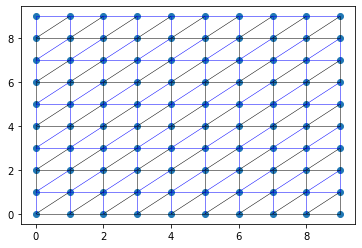

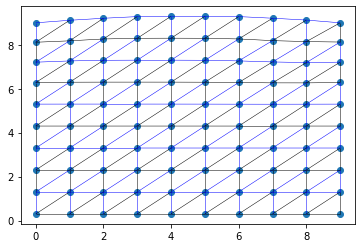

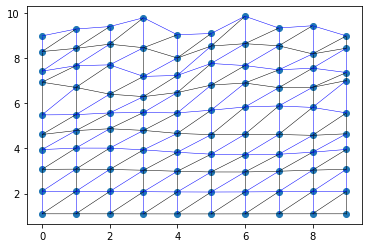

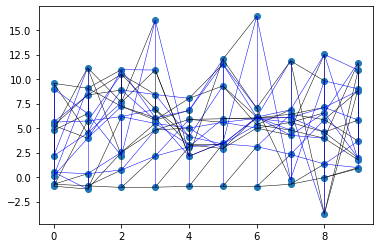

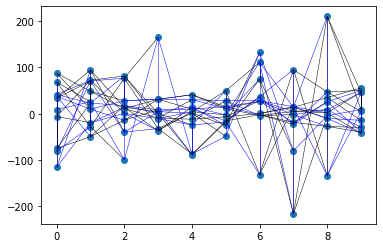

...

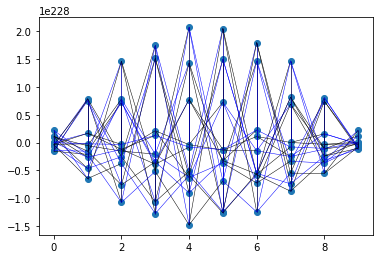

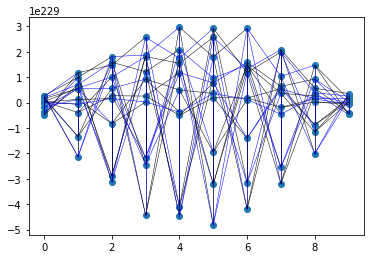

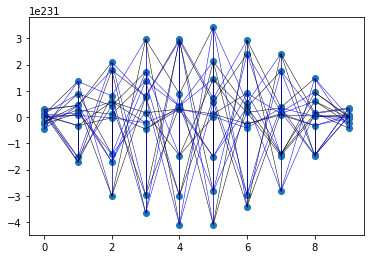

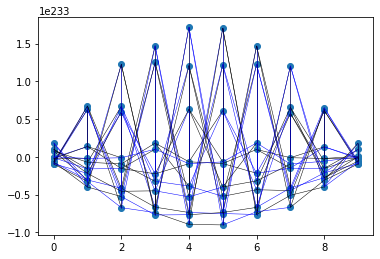

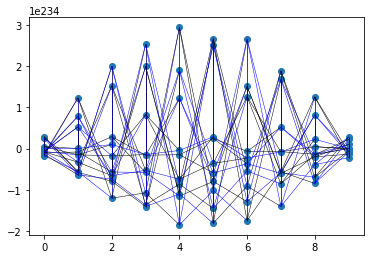

In [17]:

mesh_construct(10)


In [352]:
not True

False

In [354]:
! False

In [ ]:
def create_grid(N):
        g, pm = (0, -5), 10
        nodes = [(i//N, i%N) for i in range(N*N)]
        # edges = np.zeros(( (N-1)*(N-1) + 2*N) *4).reshape(((N-1)*(N-1) + 2*N), 2, 2)
        edges = []
        for x in range(N):
            for y in range(N):
                if x < (N - 1) and y < (N - 1):
                    edges.append((Util.c2i(x,y,N),Util.c2i(x+1,y,N)))
                    edges.append((Util.c2i(x,y,N),Util.c2i(x,y+1,N)))
                    edges.append((Util.c2i(x,y,N),Util.c2i(x+1,y+1,N)))
                    edges.append((Util.c2i(x+1,y,N),Util.c2i(x,y+1,N)))

                elif x < (N - 1) and y == (N - 1):
                    edges.append((Util.c2i(x,y,N),Util.c2i(x+1,y,N)))

                elif y < (N - 1) and x == (N - 1):
                    edges.append((Util.c2i(x,y,N),Util.c2i(x,y+1,N)))
        particles = []
        for p in nodes:
            if p == (0,N-1) or p == (N-1, N-1):
                particles.append(Particle(p, g, pm, lock = True))
            else:
                particles.append(Particle(p, g, pm))
        springs = [Spring(5, particles[ns[0]], particles[ns[1]]) for ns in edges]
        mesh = Mesh()
        mesh.batch_add(particles, springs)
        mesh.